In [83]:
import pandas as pd
import missingno as msno
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [84]:
#Read data
data = pd.read_excel("/Users/apple/Developer/Hamoye/Theano/Africa_1997-2023_Mar31.xlsx")
data.head()

,EVENT_ID_CNTY,EVENT_DATE,YEAR,TIME_PRECISION,DISORDER_TYPE,EVENT_TYPE,SUB_EVENT_TYPE,ACTOR1,ASSOC_ACTOR_1,INTER1,...,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40
0,ALG1,1997-01-01,1997,1,Political violence,Violence against civilians,Attack,GIA: Armed Islamic Group,NaN,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ALG2,1997-01-02,1997,1,Political violence,Violence against civilians,Attack,GIA: Armed Islamic Group,NaN,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ALG3,1997-01-03,1997,1,Political violence,Violence against civilians,Attack,GIA: Armed Islamic Group,NaN,2,...,NaN,TAGS,NaN,NaN,NaN,NaN,CIVILIAN_TARGETING,NaN,NaN,DISORDER_TYPE
3,ALG4,1997-01-04,1997,1,Political violence,Violence against civilians,Attack,GIA: Armed Islamic Group,NaN,2,...,NaN,NaN,NaN,NaN,NaN,NaN,Civilian targeting,NaN,NaN,Political violence
4,ALG5,1997-01-05,1997,1,Political violence,Violence against civilians,Attack,GIA: Armed Islamic Group,NaN,2,...,NaN,women targeted: girls,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Demonstrations


In [85]:
data.head().T

,0,1,2,3,4
EVENT_ID_CNTY,ALG1,ALG2,ALG3,ALG4,ALG5
EVENT_DATE,1997-01-01 00:00:00,1997-01-02 00:00:00,1997-01-03 00:00:00,1997-01-04 00:00:00,1997-01-05 00:00:00
YEAR,1997,1997,1997,1997,1997
TIME_PRECISION,1,1,1,1,1
DISORDER_TYPE,Political violence,Political violence,Political violence,Political violence,Political violence
EVENT_TYPE,Violence against civilians,Violence against civilians,Violence against civilians,Violence against civilians,Violence against civilians
SUB_EVENT_TYPE,Attack,Attack,Attack,Attack,Attack
ACTOR1,GIA: Armed Islamic Group,GIA: Armed Islamic Group,GIA: Armed Islamic Group,GIA: Armed Islamic Group,GIA: Armed Islamic Group
ASSOC_ACTOR_1,NaN,NaN,NaN,NaN,NaN
INTER1,2,2,2,2,2


In [143]:
data.isnull().sum()

EVENT_ID_CNTY              0
EVENT_DATE                 0
YEAR                       0
TIME_PRECISION             0
DISORDER_TYPE              0
EVENT_TYPE                 0
SUB_EVENT_TYPE             0
ACTOR1                     0
ASSOC_ACTOR_1         231997
INTER1                     0
ACTOR2                 86136
ASSOC_ACTOR_2         253699
INTER2                     0
INTERACTION                0
CIVILIAN_TARGETING    220363
ISO                        0
REGION                     0
COUNTRY                    0
ADMIN1                     2
ADMIN2                  2451
ADMIN3                161453
LOCATION                   0
LATITUDE                   0
LONGITUDE                  0
GEO_PRECISION              0
SOURCE                     0
SOURCE_SCALE               0
NOTES                      0
FATALITIES                 0
TAGS                  255561
TIMESTAMP                  0
Unnamed: 31           315940
Unnamed: 32           314894
Unnamed: 33           315940
Unnamed: 34   

In [86]:
conflict_count = data["COUNTRY"].value_counts()

<AxesSubplot: >

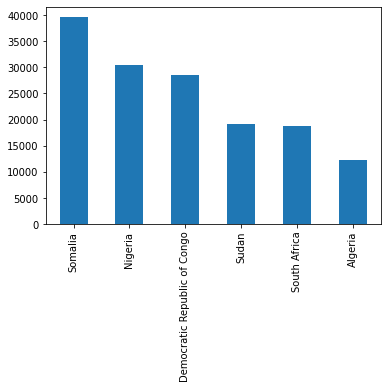

In [87]:
conflict_count.head(6).plot(kind="bar")

<AxesSubplot: >

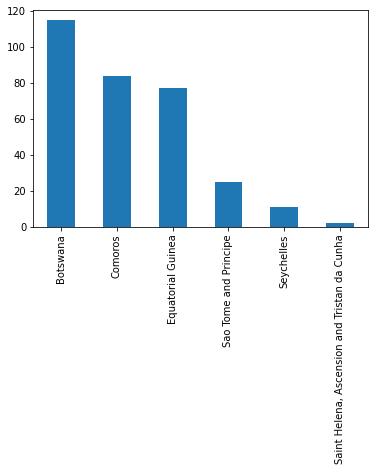

In [88]:
conflict_count.tail(6).plot(kind="bar")

### Creating a pandas dataframe only containing the top 3 countries 

In [89]:
#most = data.query("COUNTRY in ('Somalia', 'Nigeria','Democratic Republic of Congo')")
top_countries = ['Somalia', 'Nigeria','Democratic Republic of Congo']

In [90]:
# Filter the DataFrame to only include data from the top 3 countries
crime_data = data[data['COUNTRY'].isin(top_countries)]

# Print the filtered DataFrame
#print(crime_data)

# Save the filtered data into a new pandas DataFrame
top_crimes = pd.DataFrame(crime_data)

# Print the new DataFrame to confirm the data has been saved
#print(top_crimes)

# Save the filtered data to an Excel file
#top_crimes.to_excel('top_crimes_countries_data.xlsx', index=False)

### Creating a pandas dataframe only containing the bottom 3 countries 

In [91]:
bottom_countries = ['Equatorial Guinea', 'Sao Tome and Principe','Seychelles']

In [92]:
# Filter the DataFrame to only include data from the top 3 countries
crime_data = data[data['COUNTRY'].isin(bottom_countries)]

# Print the filtered DataFrame
#print(crime_data)

# Save the filtered data into a new pandas DataFrame
bottom_crimes = pd.DataFrame(crime_data)

# Print the new DataFrame to confirm the data has been saved
#print(top_crimes)

# Save the filtered data to an Excel file
#bottom_crimes.to_excel('bottom_crimes_countries_data.xlsx', index=False)

In [93]:
top_countries = pd.read_excel("/Users/apple/Developer/Hamoye/Theano/top_crimes_countries_data.xlsx")
top_countries.head()

,EVENT_ID_CNTY,EVENT_DATE,YEAR,TIME_PRECISION,DISORDER_TYPE,EVENT_TYPE,SUB_EVENT_TYPE,ACTOR1,ASSOC_ACTOR_1,INTER1,...,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40
0,DRC65,1997-02-27,1997,1,Political violence,Battles,Non-state actor overtakes territory,ADFL: Alliance of Democratic Forces for Libera...,NaN,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,DRC66,1997-02-28,1997,1,Strategic developments,Strategic developments,Change to group/activity,ADFL: Alliance of Democratic Forces for Libera...,NaN,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,DRC67,1997-02-28,1997,1,Political violence,Battles,Armed clash,ADFL: Alliance of Democratic Forces for Libera...,NaN,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,DRC68,1997-03-01,1997,1,Political violence,Battles,Non-state actor overtakes territory,ADFL: Alliance of Democratic Forces for Libera...,NaN,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,DRC69,1997-03-01,1997,1,Political violence,Battles,Non-state actor overtakes territory,ADFL: Alliance of Democratic Forces for Libera...,NaN,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [141]:
bottom_countries = pd.read_excel("/Users/apple/Developer/Hamoye/Theano/bottom_crimes_countries_data.xlsx")
bottom_countries.head()

,EVENT_ID_CNTY,EVENT_DATE,YEAR,TIME_PRECISION,DISORDER_TYPE,EVENT_TYPE,SUB_EVENT_TYPE,ACTOR1,ASSOC_ACTOR_1,INTER1,...,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40
0,EQG1,1997-07-15,1997,3,Political violence,Violence against civilians,Attack,Police Forces of Equatorial Guinea (1979-),PDGE: Equatorial Guinea Democratic Party (Equa...,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,EQG2,1997-08-26,1997,1,Political violence,Violence against civilians,Attack,Police Forces of Equatorial Guinea (1979-),PDGE: Equatorial Guinea Democratic Party (Equa...,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,EQG3,1997-09-15,1997,1,Political violence,Violence against civilians,Sexual violence,Police Forces of Equatorial Guinea (1979-),PDGE: Equatorial Guinea Democratic Party (Equa...,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,EQG4,1998-01-21,1998,1,Political violence,Battles,Armed clash,Unidentified Armed Group (Equatorial Guinea),NaN,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,EQG5,1998-06-15,1998,1,Political violence,Violence against civilians,Attack,Military Forces of Equatorial Guinea (1979-),NaN,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [95]:
print(top_countries["COUNTRY"].unique())

['Democratic Republic of Congo' 'Nigeria' 'Somalia']


In [96]:
print(bottom_countries["COUNTRY"].unique())

['Equatorial Guinea' 'Sao Tome and Principe' 'Seychelles']


In [97]:
top_countries.isnull().sum()

EVENT_ID_CNTY             0
EVENT_DATE                0
YEAR                      0
TIME_PRECISION            0
DISORDER_TYPE             0
EVENT_TYPE                0
SUB_EVENT_TYPE            0
ACTOR1                    0
ASSOC_ACTOR_1         81617
INTER1                    0
ACTOR2                14175
ASSOC_ACTOR_2         79930
INTER2                    0
INTERACTION               0
CIVILIAN_TARGETING    66662
ISO                       0
REGION                    0
COUNTRY                   0
ADMIN1                    1
ADMIN2                  797
ADMIN3                77535
LOCATION                  0
LATITUDE                  0
LONGITUDE                 0
GEO_PRECISION             0
SOURCE                    0
SOURCE_SCALE              0
NOTES                     0
FATALITIES                0
TAGS                  89680
TIMESTAMP                 0
Unnamed: 31           98617
Unnamed: 32           98617
Unnamed: 33           98617
Unnamed: 34           98617
Unnamed: 35         

In [142]:
bottom_countries.isnull().sum()

EVENT_ID_CNTY           0
EVENT_DATE              0
YEAR                    0
TIME_PRECISION          0
DISORDER_TYPE           0
EVENT_TYPE              0
SUB_EVENT_TYPE          0
ACTOR1                  0
ASSOC_ACTOR_1          68
INTER1                  0
ACTOR2                 49
ASSOC_ACTOR_2          81
INTER2                  0
INTERACTION             0
CIVILIAN_TARGETING     75
ISO                     0
REGION                  0
COUNTRY                 0
ADMIN1                  0
ADMIN2                 36
ADMIN3                113
LOCATION                0
LATITUDE                0
LONGITUDE               0
GEO_PRECISION           0
SOURCE                  0
SOURCE_SCALE            0
NOTES                   0
FATALITIES              0
TAGS                   77
TIMESTAMP               0
Unnamed: 31           113
Unnamed: 32           113
Unnamed: 33           113
Unnamed: 34           113
Unnamed: 35           113
Unnamed: 36           113
Unnamed: 37           113
Unnamed: 38 

In [98]:
top_countries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98617 entries, 0 to 98616
Data columns (total 41 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   EVENT_ID_CNTY       98617 non-null  object        
 1   EVENT_DATE          98617 non-null  datetime64[ns]
 2   YEAR                98617 non-null  int64         
 3   TIME_PRECISION      98617 non-null  int64         
 4   DISORDER_TYPE       98617 non-null  object        
 5   EVENT_TYPE          98617 non-null  object        
 6   SUB_EVENT_TYPE      98617 non-null  object        
 7   ACTOR1              98617 non-null  object        
 8   ASSOC_ACTOR_1       17000 non-null  object        
 9   INTER1              98617 non-null  int64         
 10  ACTOR2              84442 non-null  object        
 11  ASSOC_ACTOR_2       18687 non-null  object        
 12  INTER2              98617 non-null  int64         
 13  INTERACTION         98617 non-null  int64     

In [99]:
bottom_countries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113 entries, 0 to 112
Data columns (total 41 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   EVENT_ID_CNTY       113 non-null    object        
 1   EVENT_DATE          113 non-null    datetime64[ns]
 2   YEAR                113 non-null    int64         
 3   TIME_PRECISION      113 non-null    int64         
 4   DISORDER_TYPE       113 non-null    object        
 5   EVENT_TYPE          113 non-null    object        
 6   SUB_EVENT_TYPE      113 non-null    object        
 7   ACTOR1              113 non-null    object        
 8   ASSOC_ACTOR_1       45 non-null     object        
 9   INTER1              113 non-null    int64         
 10  ACTOR2              64 non-null     object        
 11  ASSOC_ACTOR_2       32 non-null     object        
 12  INTER2              113 non-null    int64         
 13  INTERACTION         113 non-null    int64         

In [100]:
top_countries.shape

(98617, 41)

<AxesSubplot: >

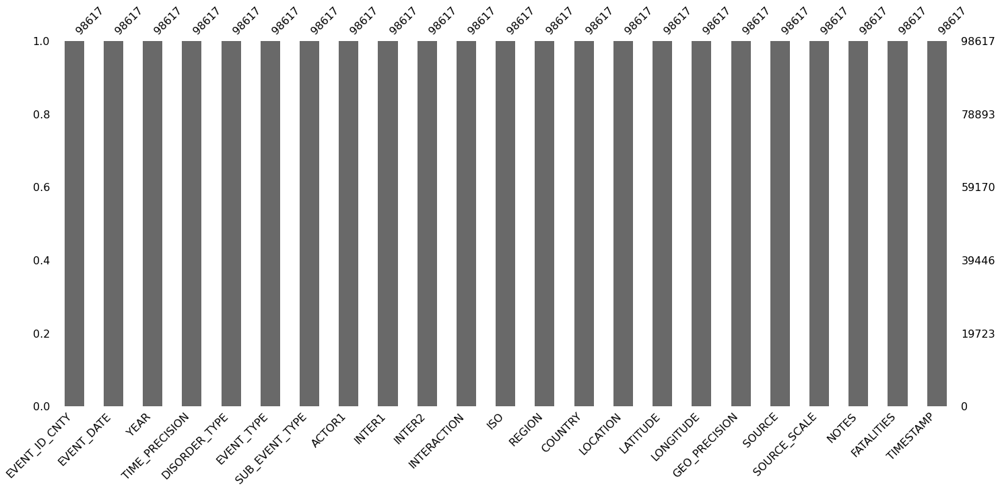

In [101]:
top_countries = top_countries.dropna(axis=1)
msno.bar(top_countries)

<AxesSubplot: >

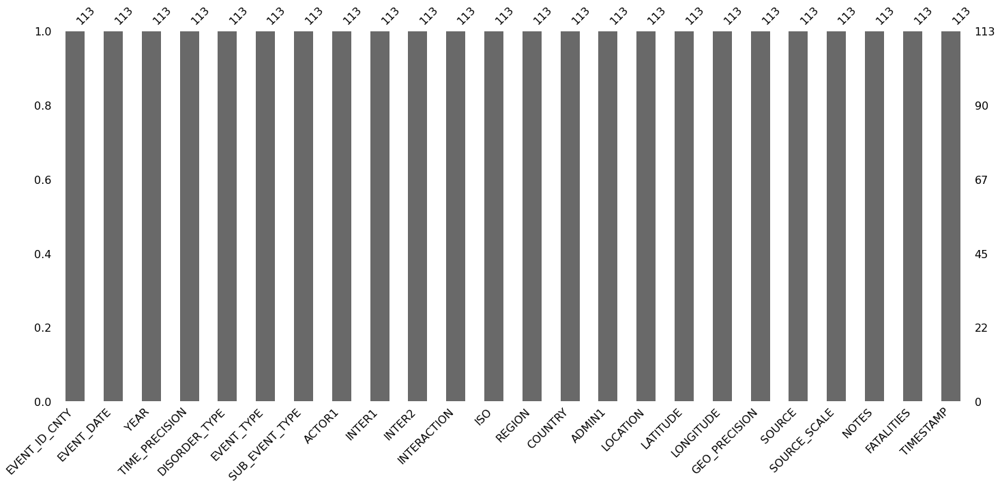

In [102]:
bottom_countries = bottom_countries.dropna(axis=1)
msno.bar(bottom_countries)

In [103]:
top_countries.isnull().sum()

EVENT_ID_CNTY     0
EVENT_DATE        0
YEAR              0
TIME_PRECISION    0
DISORDER_TYPE     0
EVENT_TYPE        0
SUB_EVENT_TYPE    0
ACTOR1            0
INTER1            0
INTER2            0
INTERACTION       0
ISO               0
REGION            0
COUNTRY           0
LOCATION          0
LATITUDE          0
LONGITUDE         0
GEO_PRECISION     0
SOURCE            0
SOURCE_SCALE      0
NOTES             0
FATALITIES        0
TIMESTAMP         0
dtype: int64

In [104]:
bottom_countries.isnull().sum()

EVENT_ID_CNTY     0
EVENT_DATE        0
YEAR              0
TIME_PRECISION    0
DISORDER_TYPE     0
EVENT_TYPE        0
SUB_EVENT_TYPE    0
ACTOR1            0
INTER1            0
INTER2            0
INTERACTION       0
ISO               0
REGION            0
COUNTRY           0
ADMIN1            0
LOCATION          0
LATITUDE          0
LONGITUDE         0
GEO_PRECISION     0
SOURCE            0
SOURCE_SCALE      0
NOTES             0
FATALITIES        0
TIMESTAMP         0
dtype: int64

In [105]:
bottom_countries.shape

(113, 24)

In [106]:
top_countries.head().T

,0,1,2,3,4
EVENT_ID_CNTY,DRC65,DRC66,DRC67,DRC68,DRC69
EVENT_DATE,1997-02-27 00:00:00,1997-02-28 00:00:00,1997-02-28 00:00:00,1997-03-01 00:00:00,1997-03-01 00:00:00
YEAR,1997,1997,1997,1997,1997
TIME_PRECISION,1,1,1,1,1
DISORDER_TYPE,Political violence,Strategic developments,Political violence,Political violence,Political violence
EVENT_TYPE,Battles,Strategic developments,Battles,Battles,Battles
SUB_EVENT_TYPE,Non-state actor overtakes territory,Change to group/activity,Armed clash,Non-state actor overtakes territory,Non-state actor overtakes territory
ACTOR1,ADFL: Alliance of Democratic Forces for Libera...,ADFL: Alliance of Democratic Forces for Libera...,ADFL: Alliance of Democratic Forces for Libera...,ADFL: Alliance of Democratic Forces for Libera...,ADFL: Alliance of Democratic Forces for Libera...
INTER1,2,2,2,2,2
INTER2,1,0,1,1,1


In [107]:
bottom_countries.head().T

,0,1,2,3,4
EVENT_ID_CNTY,EQG1,EQG2,EQG3,EQG4,EQG5
EVENT_DATE,1997-07-15 00:00:00,1997-08-26 00:00:00,1997-09-15 00:00:00,1998-01-21 00:00:00,1998-06-15 00:00:00
YEAR,1997,1997,1997,1998,1998
TIME_PRECISION,3,1,1,1,1
DISORDER_TYPE,Political violence,Political violence,Political violence,Political violence,Political violence
EVENT_TYPE,Violence against civilians,Violence against civilians,Violence against civilians,Battles,Violence against civilians
SUB_EVENT_TYPE,Attack,Attack,Sexual violence,Armed clash,Attack
ACTOR1,Police Forces of Equatorial Guinea (1979-),Police Forces of Equatorial Guinea (1979-),Police Forces of Equatorial Guinea (1979-),Unidentified Armed Group (Equatorial Guinea),Military Forces of Equatorial Guinea (1979-)
INTER1,1,1,1,3,1
INTER2,7,7,7,1,7


### EDA using Dtale library

In [108]:
import dtale

In [109]:
dtale.show(top_countries)

/opt/homebrew/anaconda3/envs/env_hamoye/lib/python3.9/site-packages/dtale/views.py:862: FutureWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`



In [110]:
dtale.show(bottom_countries)

/opt/homebrew/anaconda3/envs/env_hamoye/lib/python3.9/site-packages/dtale/views.py:862: FutureWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`



### EDA using Pandas Profiling library

In [111]:
from pandas_profiling import ProfileReport

In [112]:
profile = ProfileReport(top_countries, title="Pandas Profiling Report")

In [113]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [114]:
profile_bottom = ProfileReport(bottom_countries, title="Pandas Profiling Report for bottom countries")

In [115]:
profile_bottom

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [116]:
import seaborn as sns

- ## Comparing Top Countries with Disorder Types

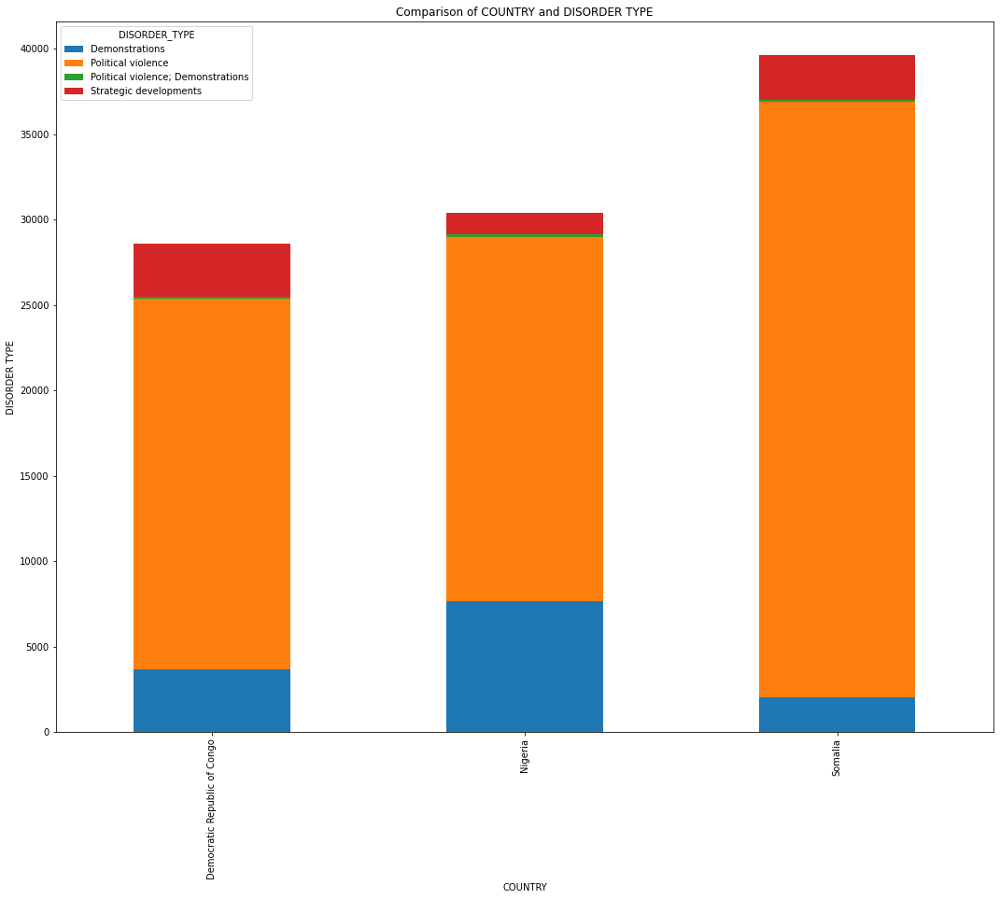

In [117]:
grouped_df = top_countries.groupby(['COUNTRY', 'DISORDER_TYPE'])['COUNTRY'].count().unstack('DISORDER_TYPE')
fig, ax = plt.subplots(figsize=(18,14)) # increase the figure size here

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('DISORDER TYPE')
ax.set_title('Comparison of COUNTRY and DISORDER TYPE')
plt.show()

- ## Comparing Bottom Countries with Disorder Types

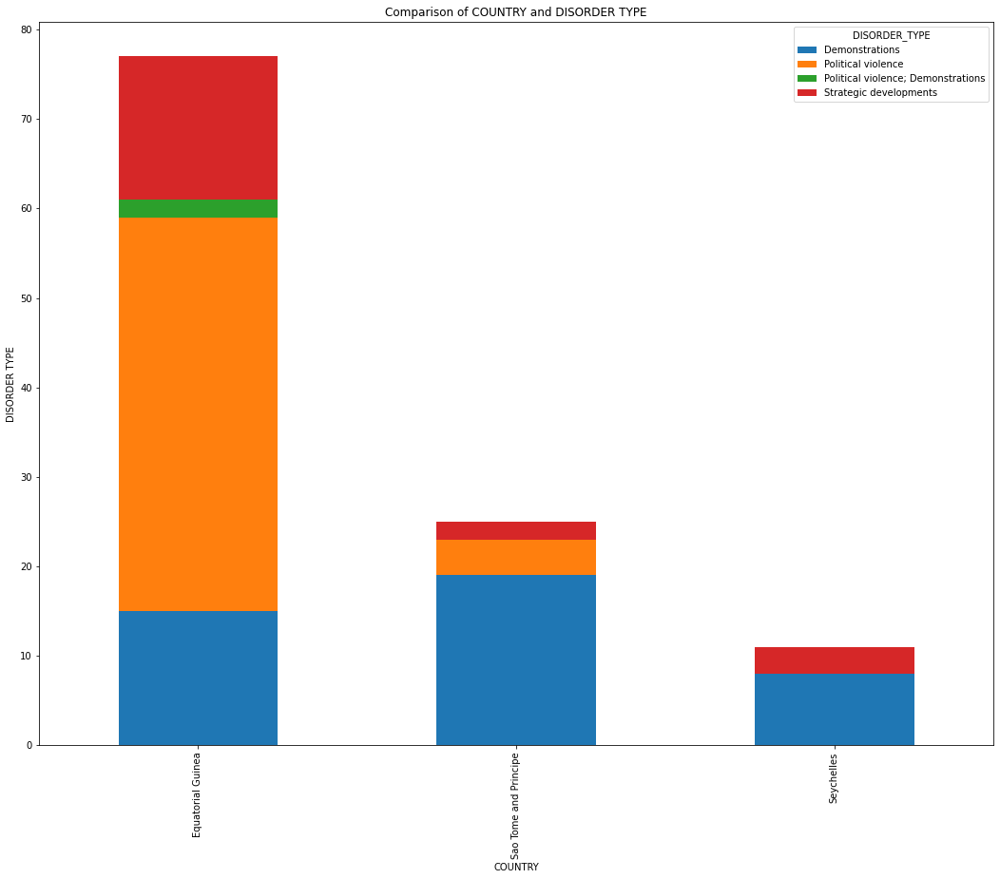

In [118]:
grouped_df = bottom_countries.groupby(['COUNTRY', 'DISORDER_TYPE'])['COUNTRY'].count().unstack('DISORDER_TYPE')
fig, ax = plt.subplots(figsize=(18,14)) # increase the figure size here

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('DISORDER TYPE')
ax.set_title('Comparison of COUNTRY and DISORDER TYPE')
plt.show()

- ## Comparing Top Countries with Event Types

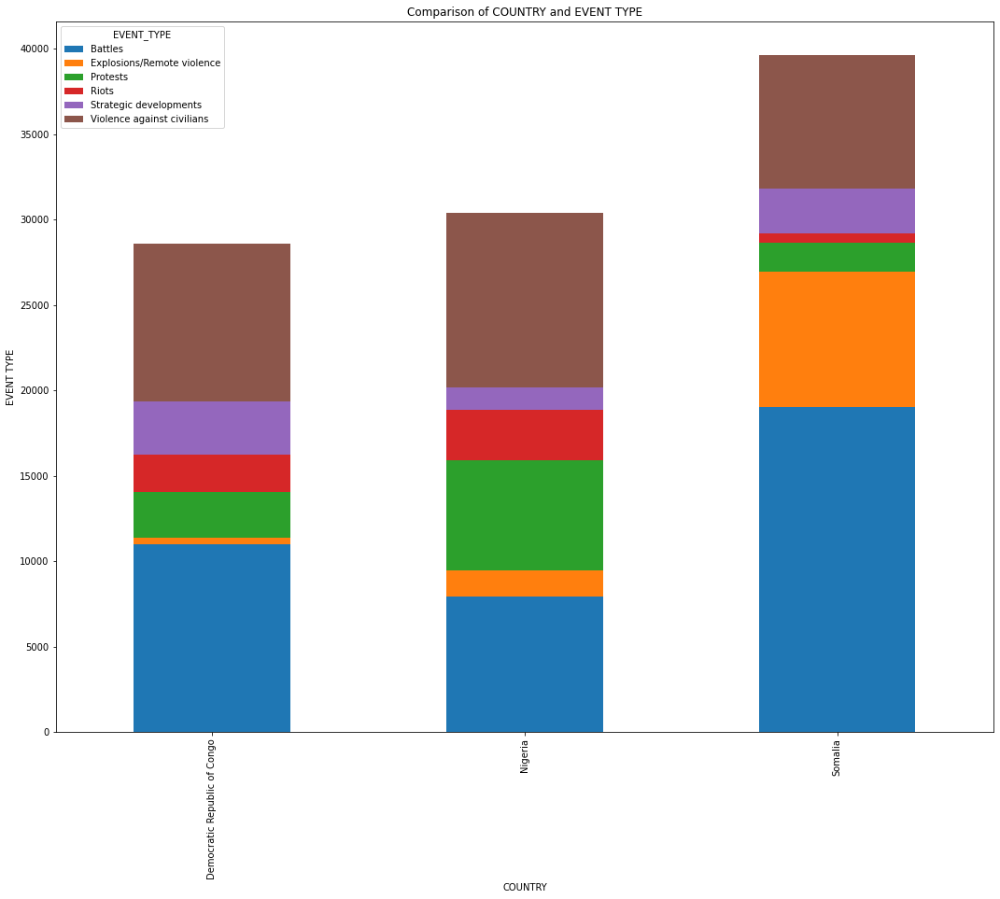

In [119]:
grouped_df = top_countries.groupby(['COUNTRY', 'EVENT_TYPE'])['COUNTRY'].count().unstack('EVENT_TYPE')
fig, ax = plt.subplots(figsize=(18,14)) # increase the figure size here

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('EVENT TYPE')
ax.set_title('Comparison of COUNTRY and EVENT TYPE')
plt.show()

- ## Comparing Bottom Countries with Event Types

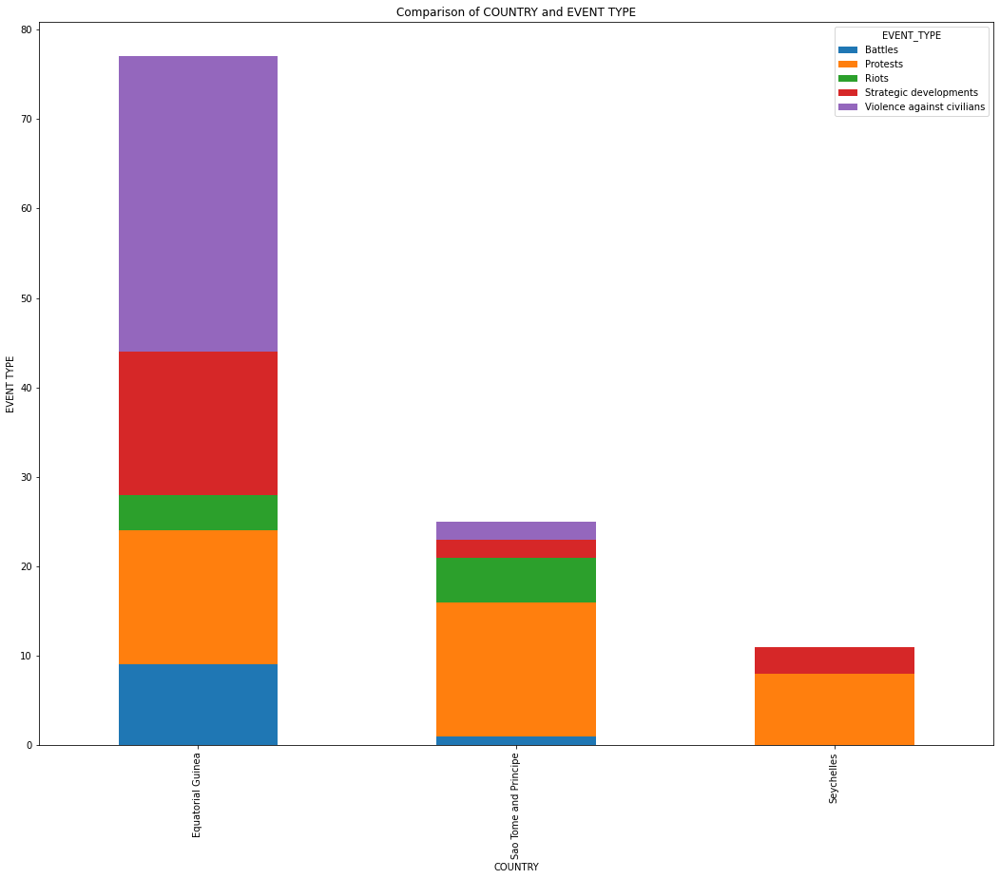

In [120]:
grouped_df = bottom_countries.groupby(['COUNTRY', 'EVENT_TYPE'])['COUNTRY'].count().unstack('EVENT_TYPE')
fig, ax = plt.subplots(figsize=(18,14)) # increase the figure size here

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('EVENT TYPE')
ax.set_title('Comparison of COUNTRY and EVENT TYPE')
plt.show()

- ## Comparing Top Countries with Sub Event Types

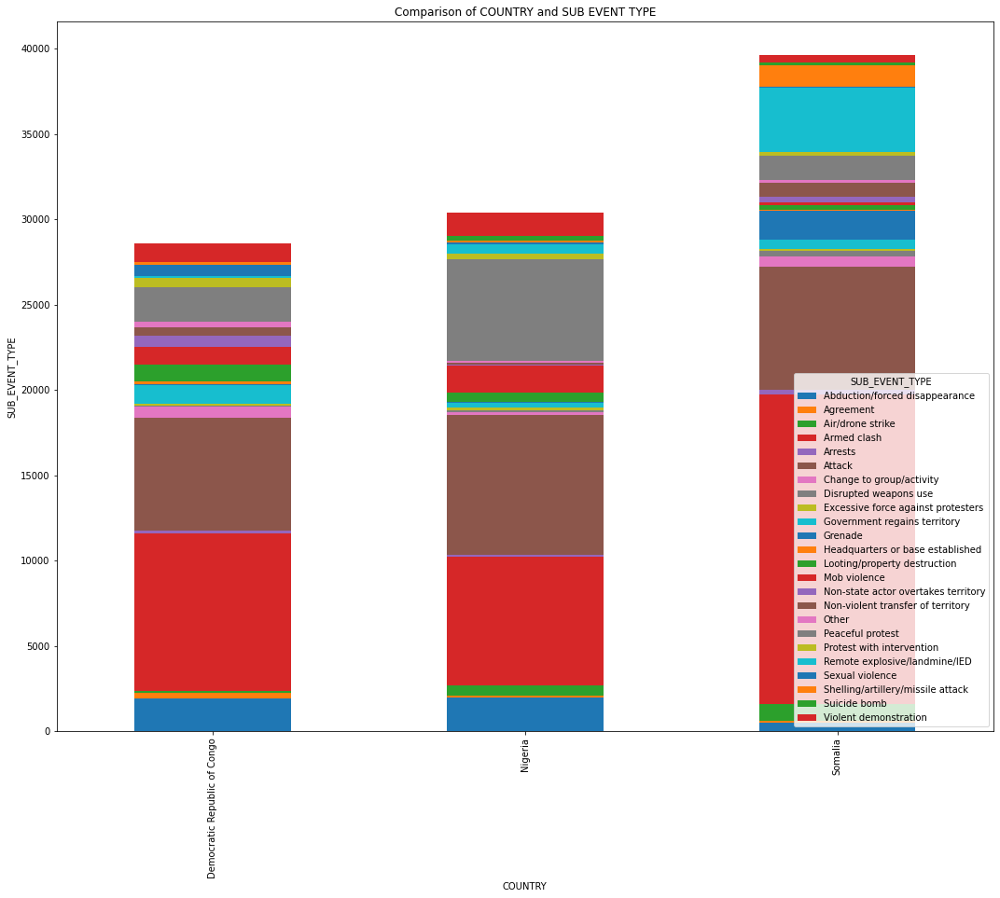

In [121]:
grouped_df = top_countries.groupby(['COUNTRY', 'SUB_EVENT_TYPE'])['COUNTRY'].count().unstack('SUB_EVENT_TYPE')
fig, ax = plt.subplots(figsize=(18,14)) # increase the figure size here

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('SUB_EVENT_TYPE')
ax.set_title('Comparison of COUNTRY and SUB EVENT TYPE')
plt.show()

- ## Comparing Bottom Countries with Sub Event Types

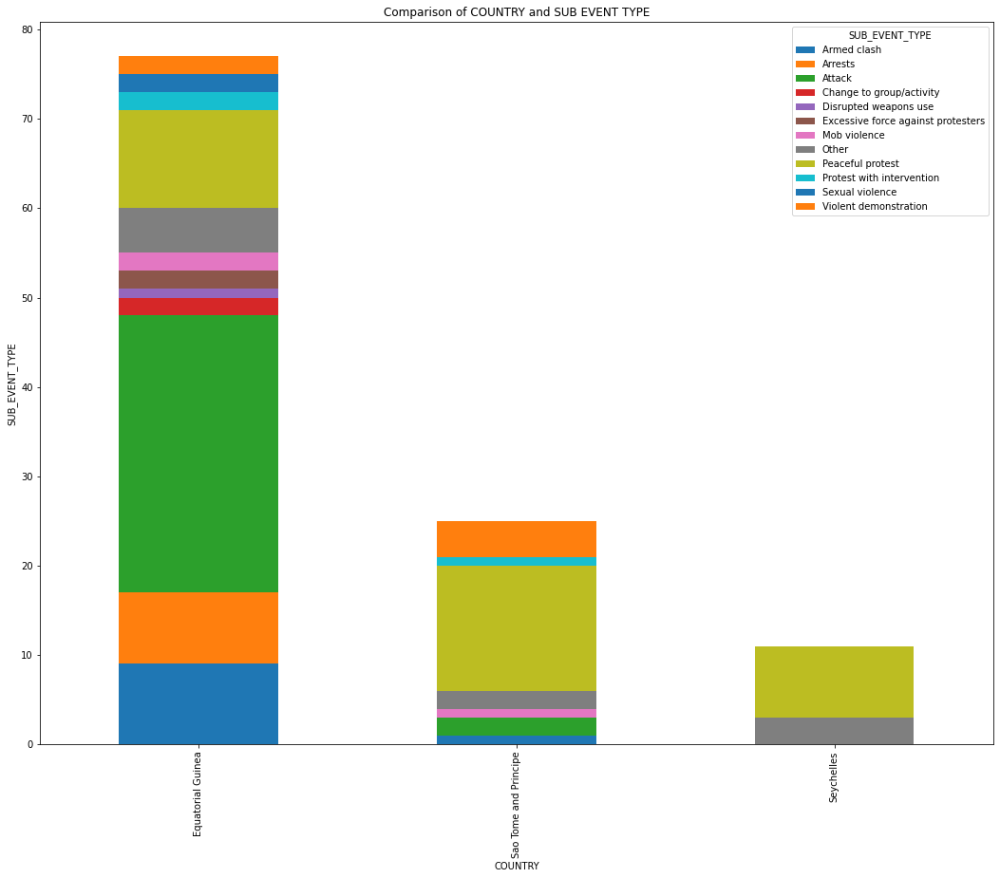

In [122]:
grouped_df = bottom_countries.groupby(['COUNTRY', 'SUB_EVENT_TYPE'])['COUNTRY'].count().unstack('SUB_EVENT_TYPE')
fig, ax = plt.subplots(figsize=(18,14)) # increase the figure size here

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('SUB_EVENT_TYPE')
ax.set_title('Comparison of COUNTRY and SUB EVENT TYPE')
plt.show()

- ## Comparing Top Countries with Actor 1

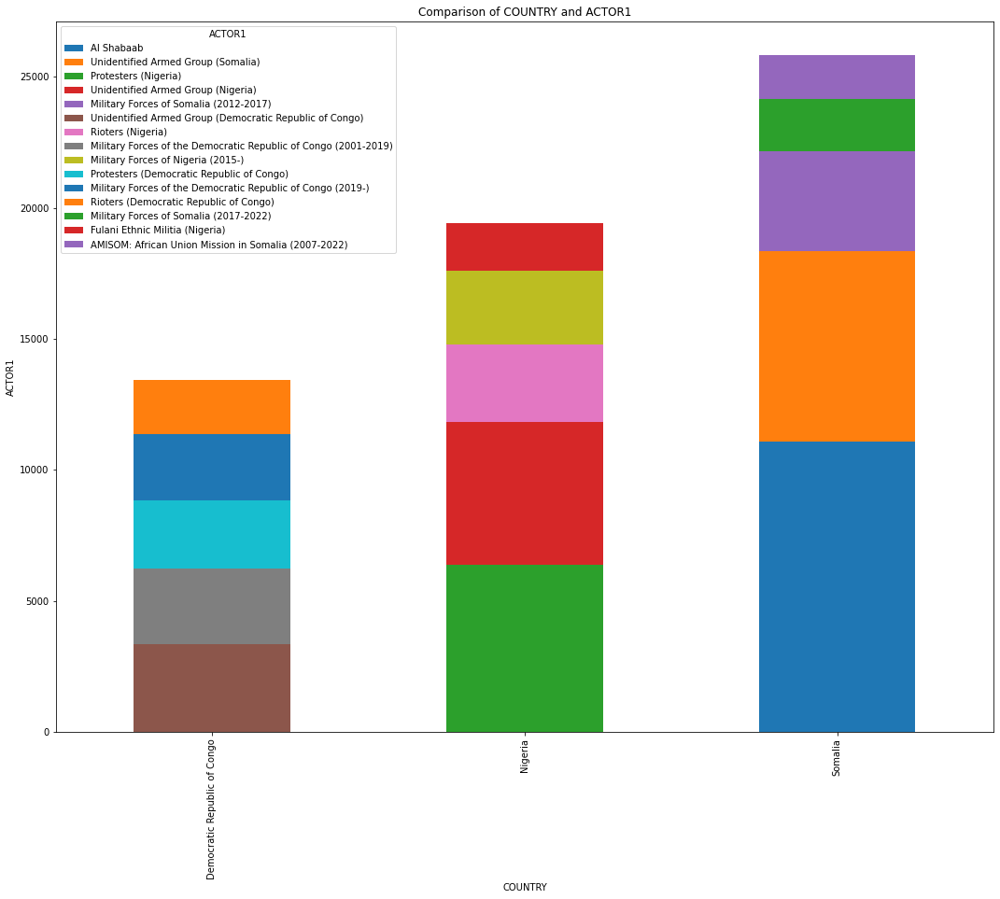

In [123]:
grouped_df = top_countries.groupby(['COUNTRY', 'ACTOR1'])['COUNTRY'].count().unstack('ACTOR1')
grouped_df = grouped_df.reindex(grouped_df.sum().sort_values(ascending=False).index[:15], axis=1)

fig, ax = plt.subplots(figsize=(18,14))

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('ACTOR1')
ax.set_title('Comparison of COUNTRY and ACTOR1')
plt.show()


- ## Comparing Bottom Countries with Actor 1

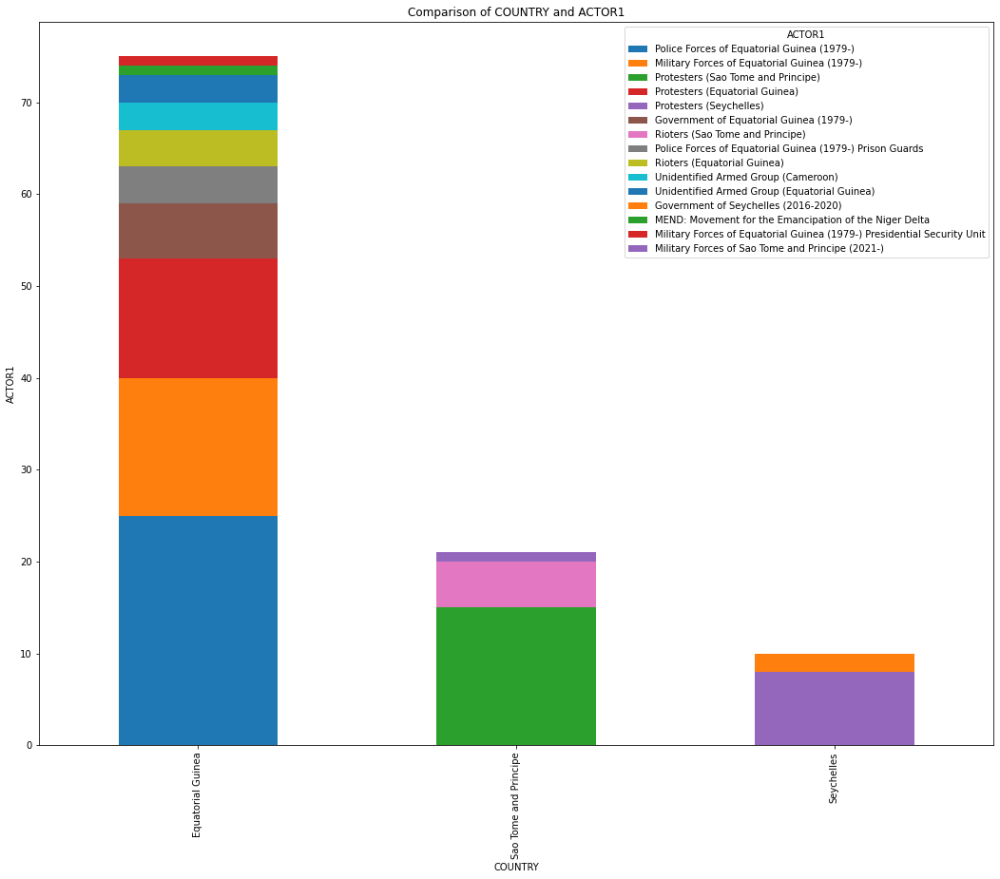

In [124]:
grouped_df = bottom_countries.groupby(['COUNTRY', 'ACTOR1'])['COUNTRY'].count().unstack('ACTOR1')
grouped_df = grouped_df.reindex(grouped_df.sum().sort_values(ascending=False).index[:15], axis=1)

fig, ax = plt.subplots(figsize=(18,14))

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('ACTOR1')
ax.set_title('Comparison of COUNTRY and ACTOR1')
plt.show()

- ## Comparing Top Countries with Actor 2

In [125]:
grouped_df = top_countries.groupby(['COUNTRY', 'ACTOR2'])['COUNTRY'].count().unstack('ACTOR2')
grouped_df = grouped_df.reindex(grouped_df.sum().sort_values(ascending=False).index[:11], axis=1)

fig, ax = plt.subplots(figsize=(18,14))

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('ACTOR2')
ax.set_title('Comparison of COUNTRY and ACTOR2')
plt.show()

KeyError: 'ACTOR2'

- ## Comparing Bottom Countries with Actor 2

In [126]:
grouped_df = bottom_countries.groupby(['COUNTRY', 'ACTOR2'])['COUNTRY'].count().unstack('ACTOR2')
grouped_df = grouped_df.reindex(grouped_df.sum().sort_values(ascending=False).index[:11], axis=1)

fig, ax = plt.subplots(figsize=(18,14))

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('ACTOR2')
ax.set_title('Comparison of COUNTRY and ACTOR2')
plt.show()

KeyError: 'ACTOR2'

- ## Comparing Top Countries with Admin 1

In [127]:
grouped_df = top_countries.groupby(['COUNTRY', 'ADMIN1'])['COUNTRY'].count().unstack('ADMIN1')
grouped_df = grouped_df.reindex(grouped_df.sum().sort_values(ascending=False).index[:15], axis=1)

fig, ax = plt.subplots(figsize=(18,14))

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('ADMIN1')
ax.set_title('Comparison of COUNTRY and ADMIN1')
plt.show()

KeyError: 'ADMIN1'

- ## Comparing Bottom Countries with Admin 1

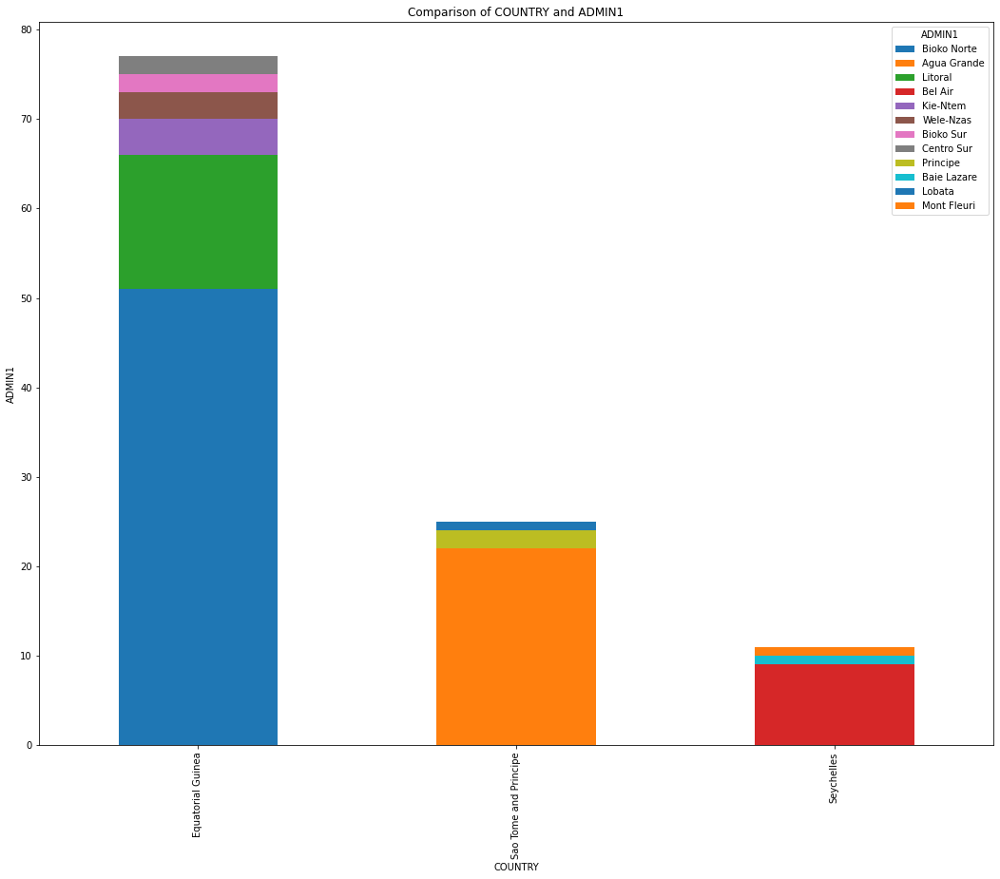

In [128]:
grouped_df = bottom_countries.groupby(['COUNTRY', 'ADMIN1'])['COUNTRY'].count().unstack('ADMIN1')
grouped_df = grouped_df.reindex(grouped_df.sum().sort_values(ascending=False).index[:15], axis=1)

fig, ax = plt.subplots(figsize=(18,14))

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('ADMIN1')
ax.set_title('Comparison of COUNTRY and ADMIN1')
plt.show()

- ## Comparing Top Countries with Admin 2

In [129]:
grouped_df = top_countries.groupby(['COUNTRY', 'ADMIN2'])['COUNTRY'].count().unstack('ADMIN2')
grouped_df = grouped_df.reindex(grouped_df.sum().sort_values(ascending=False).index[:30], axis=1)

fig, ax = plt.subplots(figsize=(18,14))

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('ADMIN2')
ax.set_title('Comparison of COUNTRY and ADMIN2')
plt.show()

KeyError: 'ADMIN2'

- ## Comparing Top Countries with Admin 2

In [130]:
grouped_df = bottom_countries.groupby(['COUNTRY', 'ADMIN2'])['COUNTRY'].count().unstack('ADMIN2')
grouped_df = grouped_df.reindex(grouped_df.sum().sort_values(ascending=False).index[:30], axis=1)

fig, ax = plt.subplots(figsize=(18,14))

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('ADMIN2')
ax.set_title('Comparison of COUNTRY and ADMIN2')
plt.show()

KeyError: 'ADMIN2'

- ## Comparing Top Countries with Fatalities

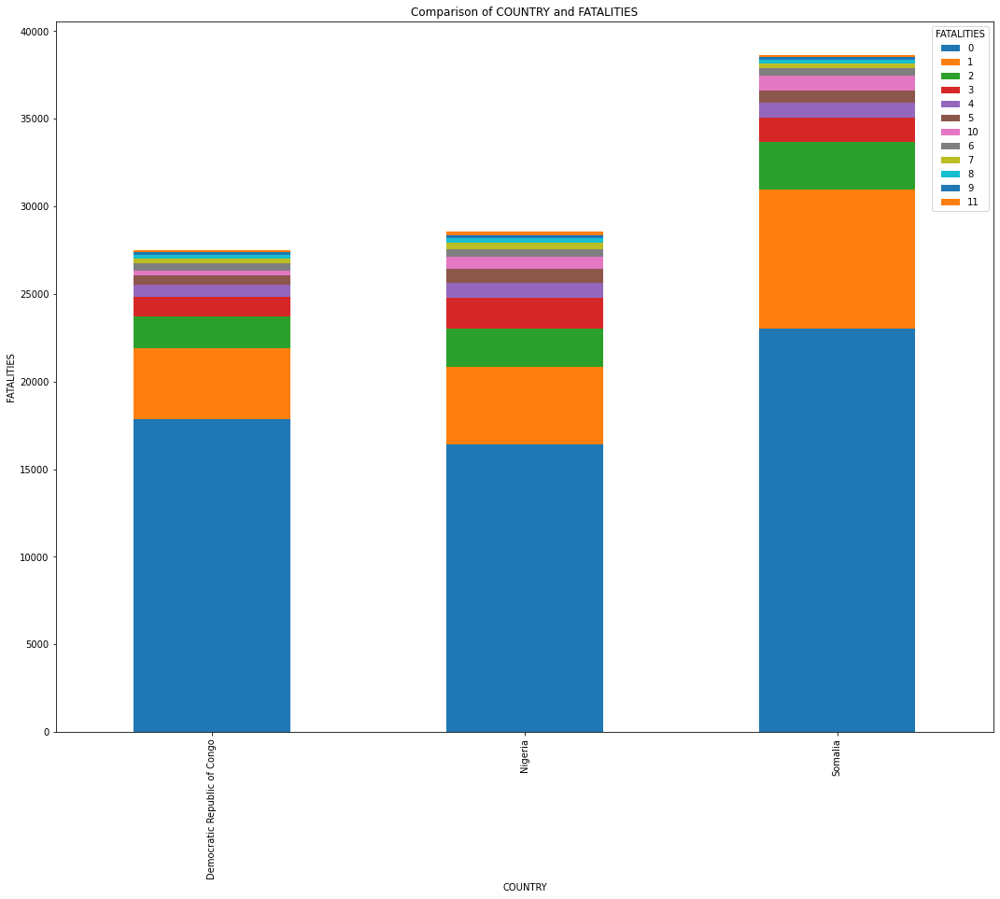

In [131]:
grouped_df = top_countries.groupby(['COUNTRY', 'FATALITIES'])['COUNTRY'].count().unstack('FATALITIES')
grouped_df = grouped_df.reindex(grouped_df.sum().sort_values(ascending=False).index[:12], axis=1)

fig, ax = plt.subplots(figsize=(18,14))

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('FATALITIES')
ax.set_title('Comparison of COUNTRY and FATALITIES')
plt.show()

- ## Comparing Bottom Countries with Fatalities

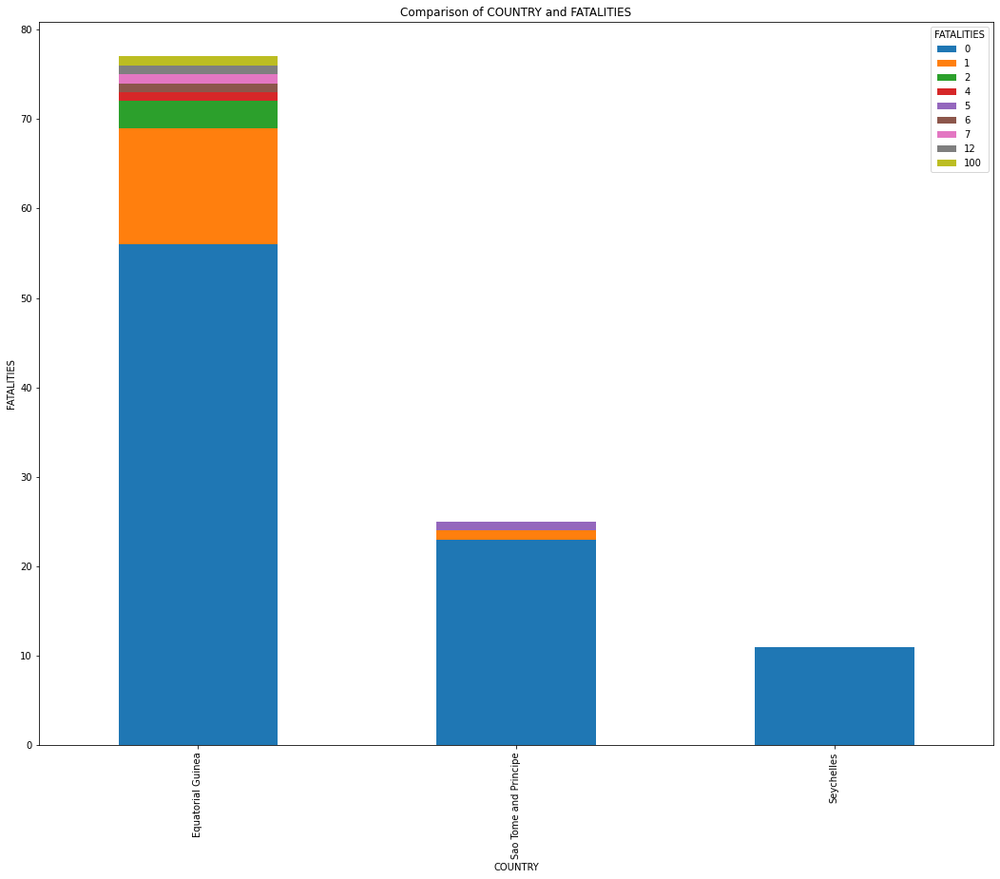

In [132]:
grouped_df = bottom_countries.groupby(['COUNTRY', 'FATALITIES'])['COUNTRY'].count().unstack('FATALITIES')
grouped_df = grouped_df.reindex(grouped_df.sum().sort_values(ascending=False).index[:12], axis=1)

fig, ax = plt.subplots(figsize=(18,14))

grouped_df.plot(kind='bar', stacked=True, ax=ax)
ax.set_xlabel('COUNTRY')
ax.set_ylabel('FATALITIES')
ax.set_title('Comparison of COUNTRY and FATALITIES')
plt.show()

In [133]:
#Hows the missing values of Actor 2 and Admin 2 handled 

#### Fatalities
- ***INTER1*** vs ***Fatalities***

<AxesSubplot: ylabel='INTER1'>

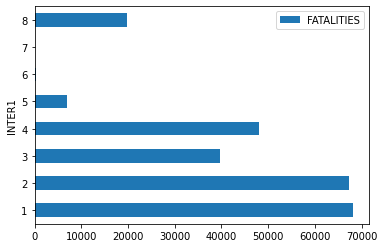

In [134]:
top_countries.groupby("INTER1")[["FATALITIES"]].sum().plot(kind="barh")

<AxesSubplot: ylabel='INTER1'>

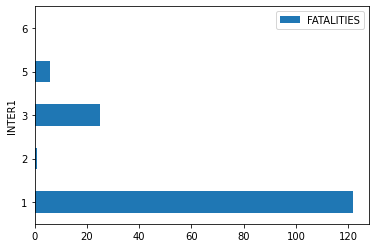

In [135]:
bottom_countries.groupby("INTER1")[["FATALITIES"]].sum().plot(kind="barh")

- ***Event and Sub_event type vs fatalities***

<AxesSubplot: ylabel='EVENT_TYPE,SUB_EVENT_TYPE'>

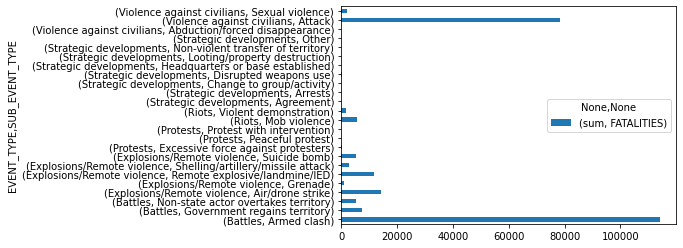

In [136]:
pd.pivot_table(top_countries,
              index = ["EVENT_TYPE","SUB_EVENT_TYPE"],
              values = ["FATALITIES"],
              aggfunc=["sum"]).plot.barh()

# add .plot.barh() to visualize your pivot tables

<AxesSubplot: ylabel='EVENT_TYPE,SUB_EVENT_TYPE'>

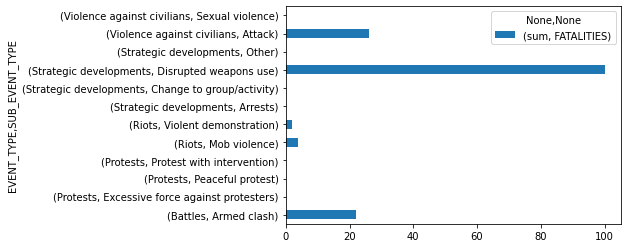

In [137]:
pd.pivot_table(bottom_countries,
              index = ["EVENT_TYPE","SUB_EVENT_TYPE"],
              values = ["FATALITIES"],
              aggfunc=["sum"]).plot.barh()

# add .plot.barh() to visualize your pivot tables

- ***Fatalities across the years***

<AxesSubplot: xlabel='YEAR'>

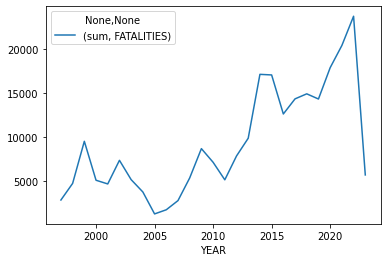

In [138]:
pd.pivot_table(top_countries,
              index = ["YEAR"],
              values = ["FATALITIES"],
              aggfunc=["sum"]).plot.line()

<AxesSubplot: xlabel='YEAR'>

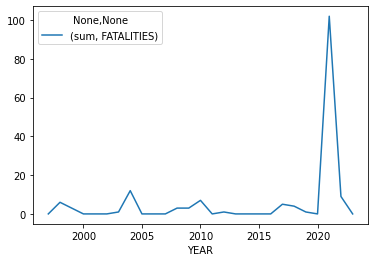

In [139]:
pd.pivot_table(bottom_countries,
              index = ["YEAR"],
              values = ["FATALITIES"],
              aggfunc=["sum"]).plot.line()